# [Preliminary Results] Evaluating Tikhonet Trained with Only Euclid PSF

In this Notebook we are going to evaluate the performance of a [Tikhonet](https://arxiv.org/pdf/1911.00443.pdf) trained using only Euclid PSF.

## Required Libraries and Functions

In [1]:
# Libraries
%matplotlib inline
from galaxy2galaxy import problems
import tensorflow as tf
from scipy import fft
import galflow as gf
import numpy as np
import matplotlib.pyplot as plt
import galsim

# Functions

def ir2tf_simplifie(imp_resp, shape):
    

    dim = 2
    # Zero padding and fill
    irpadded = np.zeros(shape)
    irpadded[tuple([slice(0, s) for s in imp_resp.shape])] = imp_resp
    # Roll for zero convention of the fft to avoid the phase
    # problem. Work with odd and even size.
    for axis, axis_size in enumerate(imp_resp.shape):

        irpadded = np.roll(irpadded,
                           shift=-int(np.floor(axis_size / 2)),
                           axis=axis)

    return fft.rfftn(irpadded, axes=range(-dim, 0))

def laplacian_simplifie(shape):
    
    impr = np.zeros([3,3])
    for dim in range(2):
        idx = tuple([slice(1, 2)] * dim +
                    [slice(None)] +
                    [slice(1, 2)] * (1 - dim))
        impr[idx] = np.array([-1.0,
                              0.0,
                              -1.0]).reshape([-1 if i == dim else 1
                                              for i in range(2)])
    impr[(slice(1, 2), ) * 2] = 4.0
    return ir2tf_simplifie(impr, shape), impr

def laplacian_tf(shape):
    return tf.convert_to_tensor(laplacian_simplifie(shape)[0])

def wiener_tf(image, psf, balance):
    reg = laplacian_tf(image.shape)
    if psf.shape != reg.shape:
        trans_func = tf.signal.rfft2d(tf.signal.ifftshift(tf.cast(psf, 'float32')))
    else:
        trans_func = psf
    
    arg1 = tf.cast(tf.math.conj(trans_func), 'complex64')
    arg2 = tf.dtypes.cast(tf.math.abs(trans_func),'complex64') ** 2
    arg3 = balance * tf.dtypes.cast(tf.math.abs(laplacian_tf(image.shape)), 'complex64')**2
    wiener_filter = arg1 / (arg2 + arg3)
    
    #deconv = tf.signal.irfft2d(wiener_filter * tf.signal.rfft2d(tf.cast(image, 'float32')))
    wiener_applied = wiener_filter * tf.signal.rfft2d(tf.cast(image, 'float32'))
    
    #deconv = tf.keras.backend.clip(deconv, -1, 1)
    
    return wiener_applied, trans_func

def pre_proc_unet(dico):
 
    dico['inputs_origin'] = dico['inputs']
    dico['psf_origin'] = dico['psf']


    #dico['psf'] = tf.signal.irfft2d(tf.cast(dico['psf'], complex64)[...,0])
    dico['psf_origin'] = dico['psf']
    x_interpolant=tf.image.ResizeMethod.BICUBIC
    # First, we interpolate the image on a finer grid
    interp_factor = 2
    Nx = 64
    Ny = 64
    dico['inputs'] = tf.image.resize(dico['inputs'],
                    [Nx*interp_factor,
                    Ny*interp_factor],
                    method=x_interpolant)
    # Since we lower the resolution of the image, we also scale the flux
    # accordingly
    dico['inputs'] = dico['inputs'] / interp_factor**2
    
    balance = 10**(-2.16)  #best after grid search
    dico['inputs'], dico['psf'] = wiener_tf(dico['inputs'][...,0], dico['psf'][...,0], balance)
    dico['inputs'] = tf.expand_dims(dico['inputs'], axis=0)
    dico['psf'] = tf.expand_dims(tf.cast(dico['psf'], 'complex64'), axis=0)
    dico['inputs'] = gf.kconvolve(dico['inputs'], dico['psf'],zero_padding_factor=1,interp_factor=interp_factor)
    dico['psf'] = tf.signal.ifftshift(tf.signal.irfft2d(tf.cast(dico['psf'][0,...], 'complex64')))
    dico['psf'] = tf.expand_dims(dico['psf'], axis=-1)
    dico['inputs'] = dico['inputs'][0,...]

    return dico['inputs'], dico['inputs2'], dico['inputs_origin']

/local/home/hk263532/miniconda3/envs/g2g/lib/python3.7/site-packages/unagi/plotting.py:30: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("viridis"))
  IMG_CMAP.set_bad(color='black')


## Generate The Evaluation Dataset

In [2]:
# Let's create an instance of the hsc_problem
Modes = tf.estimator.ModeKeys
problem128 = problems.problem('attrs2img_cosmos_psf_euclide')
dset = problem128.dataset(Modes.EVAL, data_dir='/sparseastro/Euclid/ShapeDeconv/attrs2img_cosmos_psf_euclide')
dset = dset.repeat()
dset = dset.map(pre_proc_unet)

n_batchs = 128

dset = dset.batch(n_batchs)


INFO:tensorflow:Reading data files from /sparseastro/Euclid/ShapeDeconv/attrs2img_cosmos_psf_euclide/attrs2img_cosmos_psf_euclide-dev*
INFO:tensorflow:partition: 0 num_data_files: 2

The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.



## Extract a Batch

In [3]:
# Build an iterator over this dataset, and extract a batch
iterator = dset.make_one_shot_iterator().get_next()
sess = tf.Session()
batch = sess.run(iterator)
sess.close()

Instructions for updating:
Use `for ... in dataset:` to iterate over a dataset. If using `tf.estimator`, return the `Dataset` object directly from your input function. As a last resort, you can use `tf.compat.v1.data.make_one_shot_iterator(dataset)`.


## Load and Apply Trained Model on Batch

In [4]:
model = tf.keras.models.load_model('/local/home/fnammour/Hippolyte_code/model')
res = model(batch[0])

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
If using Keras pass *_constraint arguments to layers.


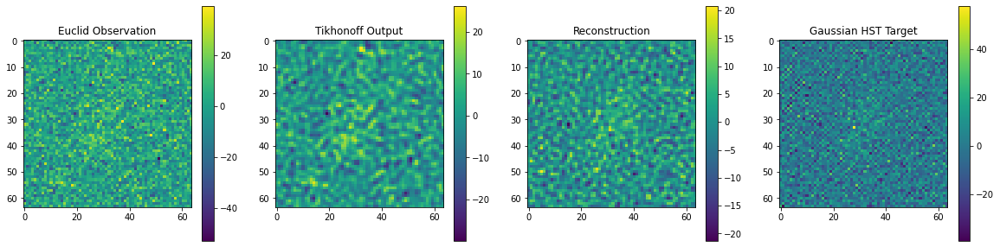

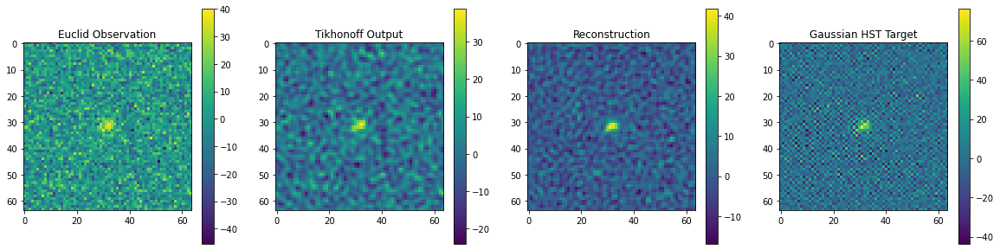

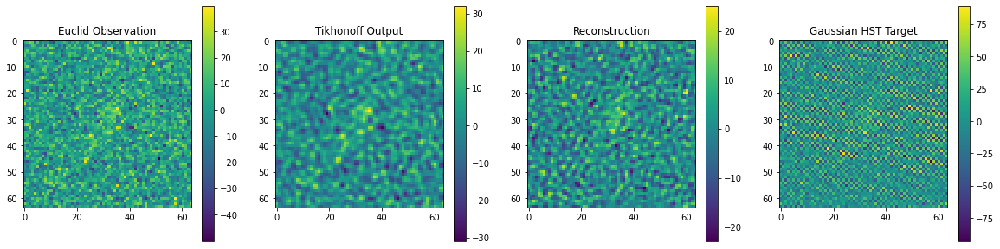

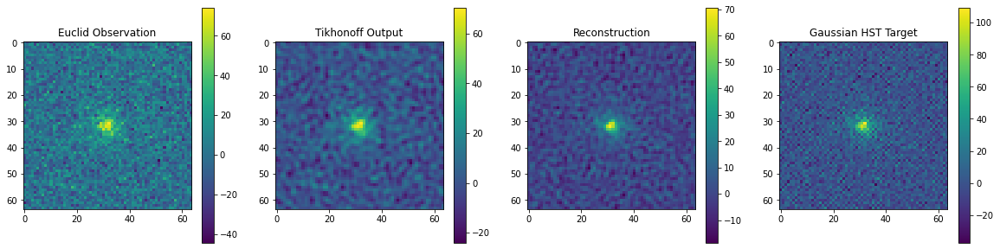

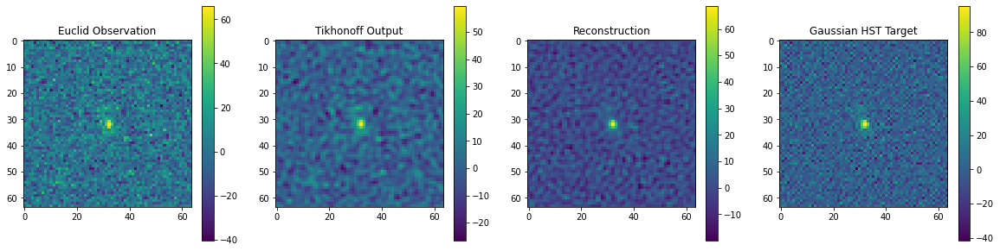

...

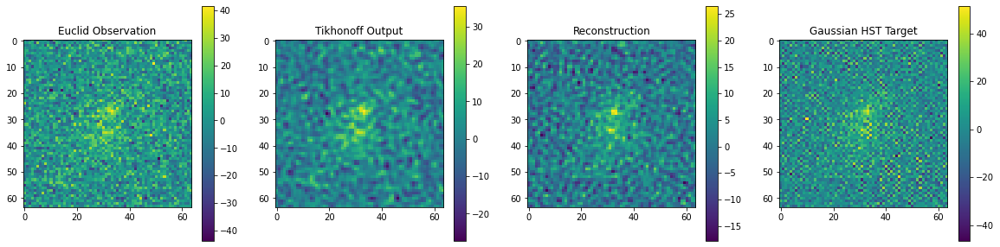

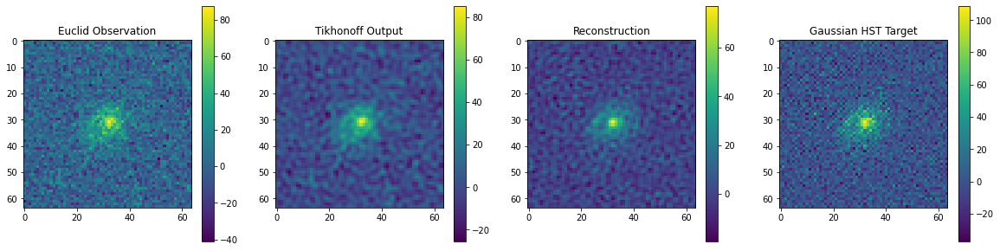

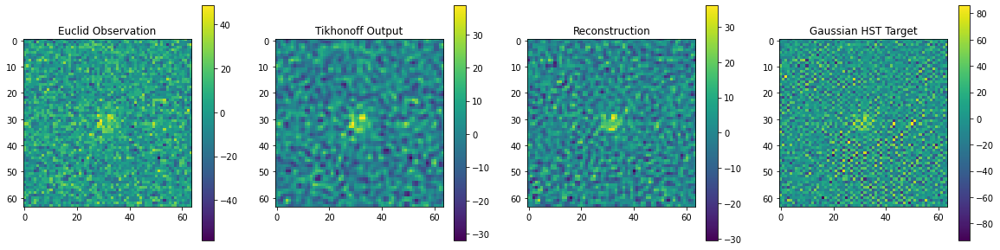

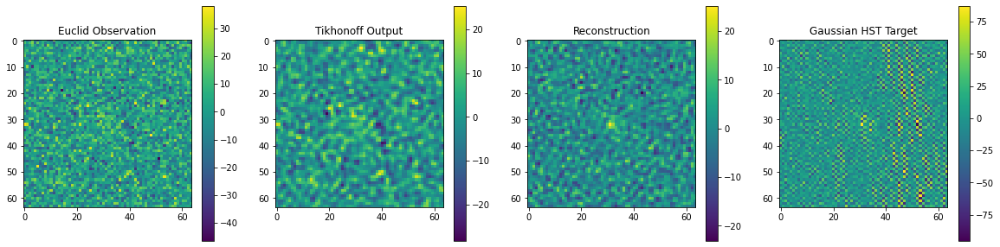

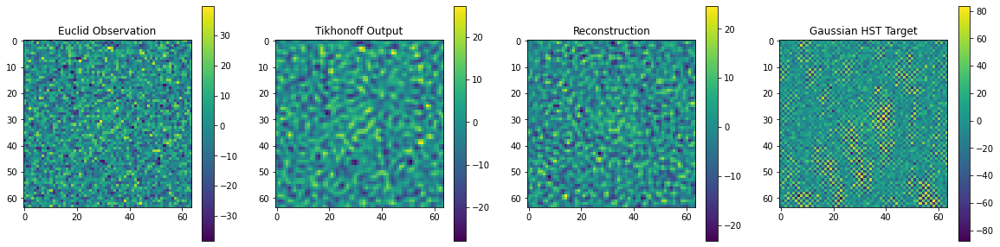

In [5]:
for i in range(batch[0].shape[0]):
    plt.figure(33,figsize=(20,5))
    plt.subplot(141)
    plt.imshow(batch[2][i])
    plt.title('Euclid Observation')
    plt.colorbar()
    plt.subplot(142)
    plt.imshow(batch[0][i])
    plt.title('Tikhonoff Output')
    plt.colorbar()
    plt.subplot(143)
    plt.imshow(tf.keras.backend.eval(res[i,...,0]))
    plt.title('Reconstruction')
    plt.colorbar()
    plt.subplot(144)
    plt.imshow(batch[1][i])
    plt.title('Gaussian HST Target')
    plt.colorbar()
    plt.show()